In [1]:
import pandas as pd                  # Pandas
import numpy as np                   # Numpy
from matplotlib import pyplot as plt # Matplotlib

# Package to implement ML Algorithms
import sklearn
import xgboost as xgb

# Import MAPIE to calculate prediction intervals
from mapie.regression import MapieRegressor

# To calculate coverage score
from mapie.metrics import regression_coverage_score

# Package for data partitioning
from sklearn.model_selection import train_test_split

# For plotting
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

# Package to record time
import time

# Module to save and load Python objects to and from files
import pickle 

# Ignore Deprecation Warnings
import warnings
warnings.filterwarnings('ignore')

#To get month names
import calendar

# Display inline plots as vector-based (svg)
%config InlineBackend.figure_formats = ['svg']

%matplotlib inline

In [2]:
# Import Data
df = pd.read_csv('California_Houses.csv')
df.head()

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
0,452600.0,8.3252,41,880,129,322,126,37.88,-122.23,9263.040773,556529.158342,735501.806984,67432.517001,21250.213767
1,358500.0,8.3014,21,7099,1106,2401,1138,37.86,-122.22,10225.733072,554279.850069,733236.884360,65049.908574,20880.600400
2,352100.0,7.2574,52,1467,190,496,177,37.85,-122.24,8259.085109,554610.717069,733525.682937,64867.289833,18811.487450
3,341300.0,5.6431,52,1274,235,558,219,37.85,-122.25,7768.086571,555194.266086,734095.290744,65287.138412,18031.047568
4,342200.0,3.8462,52,1627,280,565,259,37.85,-122.25,7768.086571,555194.266086,734095.290744,65287.138412,18031.047568


In [3]:
train_data, test_data = sklearn.model_selection.train_test_split(df, test_size=0.0005, train_size=0.9995, random_state=11)

In [4]:
train_data.to_csv('housing_train_data.csv', index=False)
test_data.to_csv('housing_user_data.csv', index=False)

In [5]:
plt.scatter(train_data["Median_Income"], train_data["Median_House_Value"], c="orange")
plt.title("Median House Value by Median Income")
plt.xlabel("Median Income (Tens of Thousands of US Dollars)")
plt.ylabel("Median House Value (Measured in US Dollars)")

Text(0, 0.5, 'Median House Value (Measured in US Dollars)')

In [30]:
plt.scatter(train_data["Median_House_Value"], train_data["Tot_Bedrooms"], c="green")
plt.title("Median House Value by Median House Value")
plt.xlabel("Total number of bedrooms within a block")
plt.ylabel("Median House Value (Measured in US Dollars)")

Text(0, 0.5, 'Median House Value (Measured in US Dollars)')

In [28]:
plt.scatter(train_data["Median_House_Value"], train_data["Median_Age"], c="hotpink")
plt.title("Median House Value by Median Age")
plt.xlabel("Median Age of a House (on a block)")
plt.ylabel("Median House Value (Measured in US Dollars)")

Text(0, 0.5, 'Median House Value (Measured in US Dollars)')

In [27]:
plt.scatter(train_data["Median_House_Value"], train_data["Median_Age"], c="hotpink")
plt.title("Median House Value by Median Age")
plt.xlabel("Median Age of a House (on a block)")
plt.ylabel("Median House Value (Measured in US Dollars)")

Text(0, 0.5, 'Median House Value (Measured in US Dollars)')

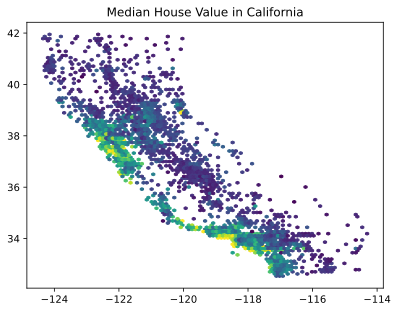

In [6]:
plt.hexbin(x=train_data["Longitude"], y=train_data["Latitude"], C=train_data["Median_House_Value"])
plt.title("Median House Value in California")
plt.savefig("pages/figures/californiamap.svg", bbox_inches = 'tight')


In [59]:
# 1. Draw the map background
fig = plt.figure(figsize=(8, 8))
m = Basemap(projection='lcc', resolution='h', 
            lat_0=37.5, lon_0=-119,
            width=1E6, height=1.2E6)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

# 2. scatter city data, with color reflecting population
# and size reflecting area
m.scatter(train_data["Longitude"], train_data["Latitude"], latlon=True,
          c=np.log10(train_data["Median_House_Value"]),
          cmap='inferno', alpha=0.5)

#m.hexbin(train_data["Longitude"], train_data["Latitude"], C=train_data["Median_House_Value"], gridsize=(2200), cmap='inferno')

# 3. create colorbar and legend
plt.colorbar(label=r'$\log_{10}({\rm population})$')
plt.clim(3, 7)

# make legend with dummy points
for a in [100, 300, 500]:
    plt.scatter([], [], c='k', alpha=0.5, s=a,
                label=str(a) + ' km$^2$')
plt.legend(scatterpoints=1, frameon=False,
           labelspacing=1, loc='lower left');

fig.savefig("californiamap2.svg", bbox_inches = 'tight')


In [57]:
import plotly.figure_factory as ff
import plotly.express as px

px.set_mapbox_access_token(open(".mapbox_token").read())
df = px.data.carshare()

fig = ff.create_hexbin_mapbox(
    data_frame=train_data, lat="Latitude", lon="Longitude",
    nx_hexagon=10, opacity=0.5, labels={"color": "Point Count"},
    min_count=1,
)
fig.show()